## Style Transfer with Deep Neural Networks

### source : [Image Style Transfer by gatys](https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Gatys_Image_Style_Transfer_CVPR_2016_paper.pdf)

- Style transfer uses the features found in the **19-layer VGG Network**, which is comprised of a series of convolutional and pooling layers, and a few fully-connected layers
- The convolutional layers are named by stack and their order in the stack. Conv_1_1 is the first convolutional layer that an image is passed through, in the first stack. Conv_2_1 is the first convolutional layer in the second stack. The deepest convolutional layer in the network is conv_5_4.

## Separating Style and Content

Style transfer relies on separating the content and style of an image. Given one content image and one style image, we aim to create a new, target image which should contain our desired content and style components:

- objects and their arrangement are similar to that of the **content image**
- style, colors, and textures are similar to that of the **style image**
- **Use  pre-trained VGG19 Net to extract content or style features from a passed in image**





# Import Statements

In [1]:
# Installing pytorch and torchvision
!pip3 install torch torchvision
!pip install --no-cache-dir -I pillow

     |████████████████████████████████| 3.0MB 7.8MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.


In [2]:
# import resources
%matplotlib inline

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import pickle 
import joblib 
import torch
import torch.optim as optim
from torchvision import transforms, models

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Saving and Loading functions 

In [5]:
import joblib
def save(filename, obj):
  with open(filename, 'wb') as handle:
      joblib.dump(obj, handle, protocol=pickle.HIGHEST_PROTOCOL)

def load(filename):
  with open(filename, 'rb') as handle:
      return joblib.load(filename)

# Pre-Trained Model : VGG19 

## Load in VGG19 (features)
VGG19 is split into two portions:

- **vgg19.features**, which are all the convolutional and pooling layers
- **vgg19.classifier**, which are the three linear, classifier layers at the end

**We only need the features portion, which we're going to load in and "freeze" the weights of, below.**

In [6]:
# get the "features" portion of VGG19 (we will not need the "classifier" portion)
vgg = models.vgg19(pretrained=True).features

# freeze all VGG parameters since we're only optimizing the target image
for param in vgg.parameters():
    param.requires_grad_(False)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


In [7]:
# move the model to GPU, if present
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

# Utility functions 

## Loading Content and Style Images
You can load in any images you want! 
Below is a helper function 
Additionally, it will be easier to have smaller images and to squish the content and style images so that they are of the same size.

In [8]:
def  load_image(img_path, max_size=400, shape=None):
    ''' Load in and transform an image, making sure the image
       is <= 400 pixels in the x-y dims.'''
    
    image = Image.open(img_path).convert('RGB')
    
    # large images will slow down processing
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)
    
    if shape is not None:
        size = shape
        
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])

    # discard the transparent, alpha channel (that's the :3) and add the batch dimension
    image = in_transform(image)[:3,:,:].unsqueeze(0)
    
    return image

In [9]:
# helper function for un-normalizing an image 
# and converting it from a Tensor image to a NumPy image for display
def im_convert(tensor):
    """ Display a tensor as an image. """
    
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

## Content and Style Features
 Mapping of layer names to the names found in the paper for the content representation and the style representation.


In [10]:
def get_features(image, model, layers=None):
    """ Run an image forward through a model and get the features for 
        a set of layers. Default layers are for VGGNet matching Gatys et al (2016)
    """
    
    ##  mapping layer names of PyTorch's VGGNet to names from the paper
    ## Need the layers for the content and style representations of an image
    if layers is None:
        layers = {'0': 'conv1_1',
                 '5': 'conv2_1',
                 '10': 'conv3_1',
                 '19': 'conv4_1',
                 '21': 'conv4_2',
                 '28': 'conv5_1'}
        
    
    features = {}
    x = image
    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
            
    return features


## Gram Matrix
The output of every convolutional layer is a Tensor with dimensions associated with the batch_size, a depth, d and some height and width (h, w). The Gram matrix of a convolutional layer can be calculated as follows:

- Get the depth, height, and width of a tensor using batch_size, d, h, w = tensor.size
- Reshape that tensor so that the spatial dimensions are flattened
- Calculate the gram matrix by multiplying the reshaped tensor by it's transpose



In [11]:
def gram_matrix(tensor):
    """ Calculate the Gram Matrix of a given tensor 
        Gram Matrix: https://en.wikipedia.org/wiki/Gramian_matrix
    """
    
    ## get the batch_size, depth, height, and width of the Tensor
    ## reshape it, so we're multiplying the features for each channel
    ## calculate the gram matrix
    tensor = tensor.view(tensor.shape[1], tensor.shape[2]*tensor.shape[3])
    gram = torch.mm(tensor, tensor.t())
    
    return gram 

## Loss and Weights
### Individual Layer Style Weights
Below, you are given the option to weight the style representation at each relevant layer. It's suggested that you use a range between 0-1 to weight these layers. By weighting earlier layers (conv1_1 and conv2_1) more, you can expect to get larger style artifacts in your resulting, target image. Should you choose to weight later layers, you'll get more emphasis on smaller features. This is because each layer is a different size and together they create a multi-scale style representation!

### Content and Style Weight
**Just like in the paper, we define an alpha (content_weight) and a beta (style_weight). This ratio will affect how stylized your final image is. It's recommended that you leave the content_weight = 1 and set the style_weight to achieve the ratio you want.**

In [12]:
# weights for each style layer 
# weighting earlier layers more will result in *larger* style artifacts
# notice we are excluding `conv4_2` our content representation 
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.8,
                 'conv3_1': 0.5,
                 'conv4_1': 0.3,
                 'conv5_1': 0.1}

# you may choose to leave these as is
content_weight = 1  # alpha
style_weight = 1e6  # beta

# Final Code 


## Updating the Target & Calculating Losses

- decide on a number of steps for which to update your image, 
- only changing our target image and nothing else about VGG19 or any other image. 

Inside the iteration loop, calculate the content and style losses and update your target image, accordingly.

### Content Loss
The content loss will be the mean squared difference between the target and content features at layer conv4_2. This can be calculated as follows:

content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)

### Style Loss
- The style loss is calculated in a similar way, only you have to iterate through a number of layers, specified by name in our dictionary  style_weights.

- calculate the gram matrix for the target image, target_gram and style image style_gram at each of these layers and compare those gram matrices, calculating the layer_style_loss.This value is normalized by the size of the layer.

-Total Loss
Finally, the total loss by adding up the style and content losses and weighting them with your specified alpha and beta!


## Chnaging the Target Image

In [13]:
def apply_style_transfer(content_img_path, style_img_path):

  # load in content and style image
  content = load_image(content_img_path).to(device)
  # Resize style to match content, makes code easier
  style = load_image(style_img_path, shape=content.shape[-2:]).to(device)

  # display the images
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
  # content and style ims side-by-side
  ax1.imshow(im_convert(content))
  ax2.imshow(im_convert(style))

  #We'll extract our features from our images and calculate the gram matrices for each layer in our style representation.
  # get content and style features only once before forming the target image
  content_features = get_features(content, vgg)
  style_features = get_features(style, vgg)

  # calculate the gram matrices for each layer of our style representation
  style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

  # create a third "target" image and prep it for change
  # it is a good idea to start of with the target as a copy of our *content* image
  # then iteratively change its style
  target = content.clone().requires_grad_(True).to(device)

  # weights for each style layer 
  # weighting earlier layers more will result in *larger* style artifacts
  # notice we are excluding `conv4_2` our content representation
  style_weights = {'conv1_1': 1.,
                  'conv2_1': 0.8,
                  'conv3_1': 0.5,
                  'conv4_1': 0.3,
                  'conv5_1': 0.1}

  # you may choose to leave these as is
  content_weight = 1  # alpha
  style_weight = 1e4  # beta

  # for displaying the target image, intermittently
  show_every = 500 

  
  # iteration hyperparameters
  optimizer = optim.Adam([target], lr=0.003)
  steps = 5000  # decide how many iterations to update your image 

  for ii in range(1, steps+1):
      
      ## get the features from your target image    
      ## Then calculate the content loss
      target_features = get_features(target, vgg)
      content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
      
      # the style loss
      # initialize the style loss to 0
      style_loss = 0
      # iterate through each style layer and add to the style loss
      for layer in style_weights:
          # get the "target" style representation for the layer
          target_feature = target_features[layer]
          _, d, h, w = target_feature.shape
          
          ## Calculate the target gram matrix
          target_gram = gram_matrix(target_feature)
          
          ## get the "style" style representation
          style_gram = style_grams[layer]
          
          ## Calculate the style loss for one layer, weighted appropriately
          layer_style_loss = style_weights[layer] * torch.mean((style_gram - target_gram)**2)
          
          # add to the style loss
          style_loss += layer_style_loss / (d * h * w)
          
          
      ## calculate the *total* loss
      total_loss = content_weight * content_loss + style_weight * style_loss
      
      
      # update your target image
      optimizer.zero_grad()
      total_loss.backward()
      optimizer.step()
      
      # display intermediate images and print the loss
      # if  ii % show_every == 0:
      #     print('Total loss: ', total_loss.item())
      #     plt.imshow(im_convert(target))
      #     plt.show()

  return content,style,target 


# Outputs

## output 1

Total loss:  1772942.25


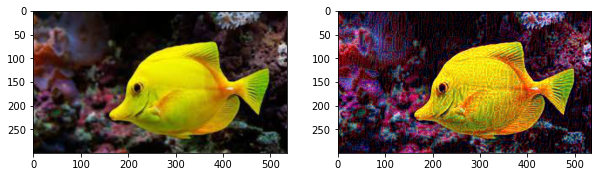

Total loss:  726062.125


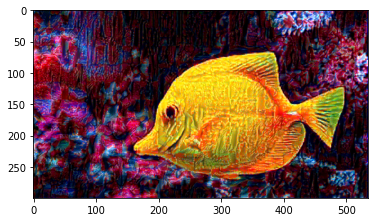

Total loss:  350380.25


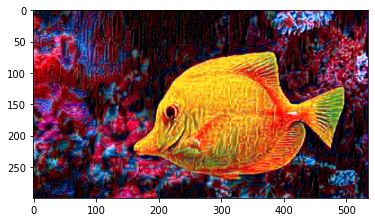

Total loss:  171951.421875


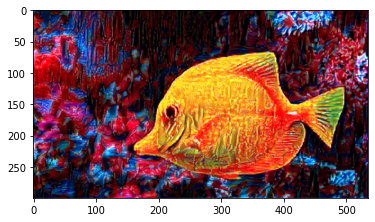

Total loss:  97308.1328125


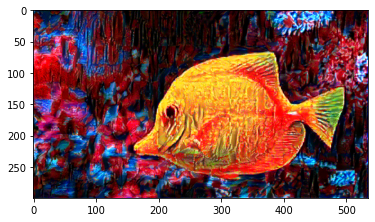

Total loss:  63833.578125


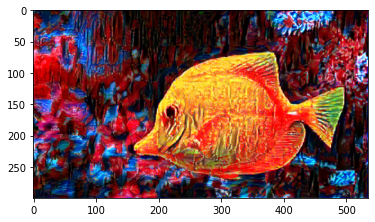

Total loss:  45036.09765625


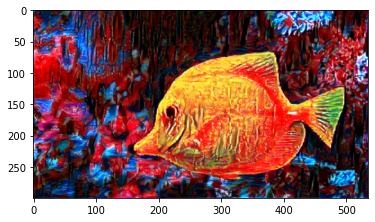

Total loss:  33092.61328125


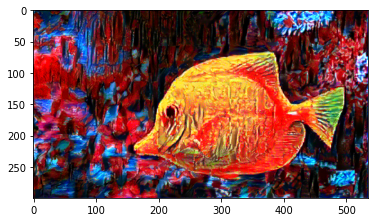

Total loss:  25132.05859375


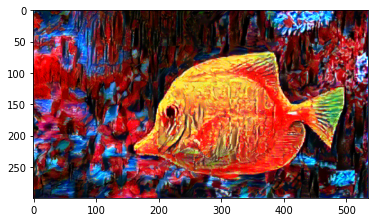

Total loss:  19684.19921875


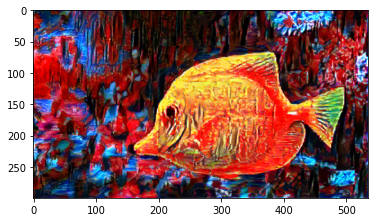

In [ ]:
t_paths = ['4.jpeg']
basic_path = '/content/drive/MyDrive/Colab Notebooks/style_transfer/'
c_path = '/content/drive/MyDrive/Colab Notebooks/style_transfer/content_img3.jpeg'

content1,style1,target1 = apply_style_transfer(c_path, basic_path+'texture_img'+t_paths[0])

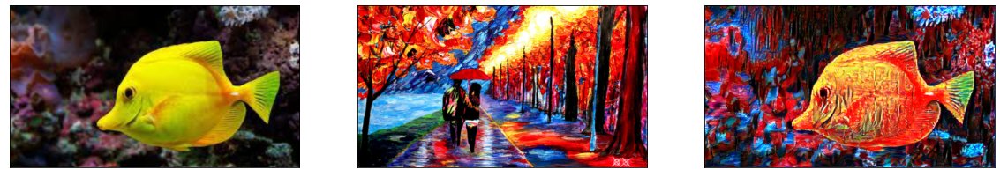

In [ ]:
# display the images
fig, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(20, 15))
# content and style ims side-by-side
ax1.imshow(im_convert(content1))
ax2.imshow(im_convert(style1))
ax3.imshow(im_convert(target1))

ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)

ax2.xaxis.set_visible(False)
ax2.yaxis.set_visible(False)

ax3.xaxis.set_visible(False)
ax3.yaxis.set_visible(False)

ax1.title.set_text("Content Image")
ax2.title.set_text("Style Image")
ax3.title.set_text("Target Image")

plt.savefig("./plot2.png")

## output 2

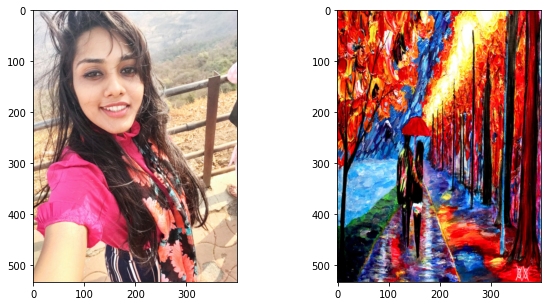

In [ ]:
t_paths = ['4.jpeg']
basic_path = '/content/drive/MyDrive/Colab Notebooks/style_transfer/'
c_path = '/content/drive/MyDrive/Colab Notebooks/style_transfer/2020-04-10-11-47-29.jpg'

content1,style1,target1 = apply_style_transfer(c_path, basic_path+'texture_img'+t_paths[0])

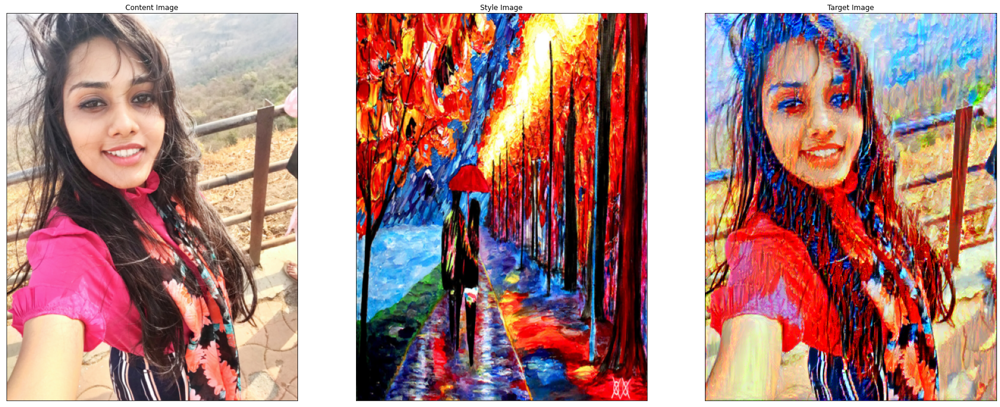

In [ ]:
# display the images
fig, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(30, 25))
# content and style ims side-by-side
ax1.imshow(im_convert(content1))
ax2.imshow(im_convert(style1))
ax3.imshow(im_convert(target1))

ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)

ax2.xaxis.set_visible(False)
ax2.yaxis.set_visible(False)

ax3.xaxis.set_visible(False)
ax3.yaxis.set_visible(False)

ax1.title.set_text("Content Image")
ax2.title.set_text("Style Image")
ax3.title.set_text("Target Image")

plt.savefig("./plot3.png")

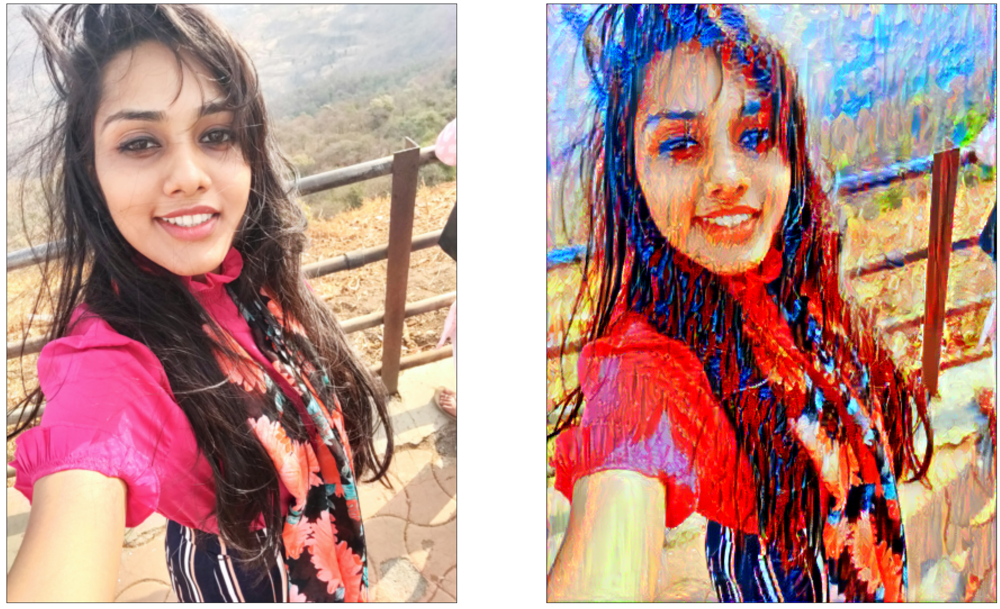

In [ ]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 25))
# content and style ims side-by-side
ax1.imshow(im_convert(content1))

ax2.imshow(im_convert(target1))

ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)

ax2.xaxis.set_visible(False)
ax2.yaxis.set_visible(False)

# ax1.title.set_text("Content Image")
# ax2.title.set_text("Target Image")

plt.savefig("./plot4.png")

## output 3 

In [ ]:
# t_paths = ['1.jpeg', '2.jpeg', '3.jpeg','4.jpeg','5.jpeg','7.jpeg','8.jpeg']
# basic_path = '/content/drive/MyDrive/Colab Notebooks/style_transfer/'
# c_path = '/content/drive/MyDrive/Colab Notebooks/style_transfer/content_img4.jpeg'
# result = []

# for name in t_paths:
#   content1,style1, target1 = apply_style_transfer(c_path, basic_path+'texture_img'+name)
#   result.append((content1, style1, target1))

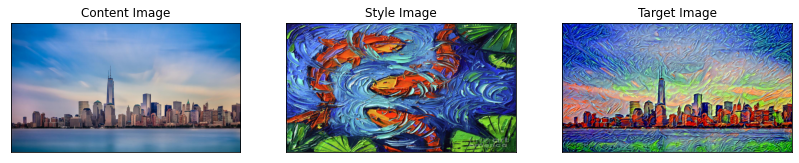

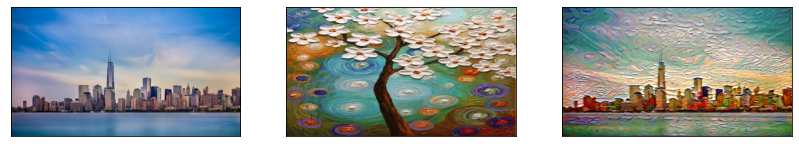

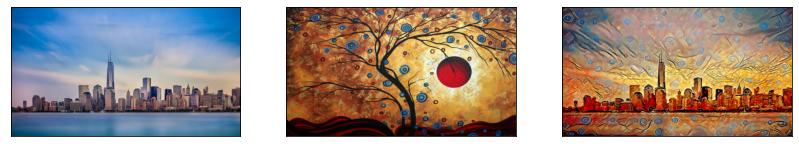

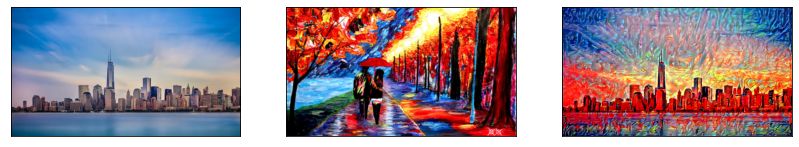

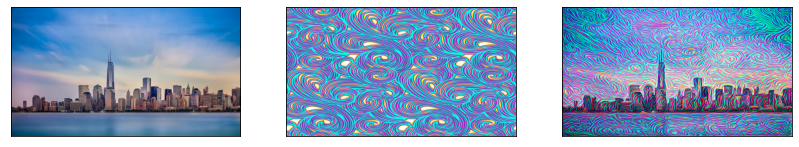

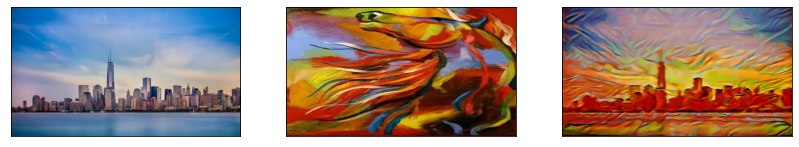

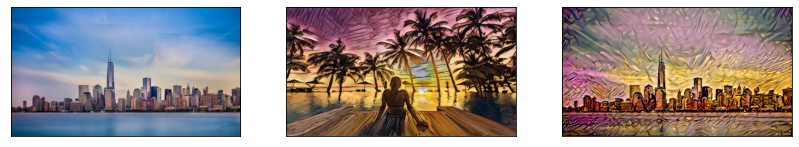

In [ ]:
result = load('/content/drive/MyDrive/Colab Notebooks/style_transfer/results_all_img4.pkl')

for i,(c,s,t) in enumerate(result):
  # display content and final, target image
  fig, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(14, 10))
  ax1.imshow(im_convert(c))
  ax2.imshow(im_convert(s))
  ax3.imshow(im_convert(t))

  ax1.xaxis.set_visible(False)
  ax1.yaxis.set_visible(False)

  ax2.xaxis.set_visible(False)
  ax2.yaxis.set_visible(False)

  ax3.xaxis.set_visible(False)
  ax3.yaxis.set_visible(False)

  if i==0:
    
    ax1.title.set_text("Content Image")
    ax2.title.set_text("Style Image")
    ax3.title.set_text("Target Image")

  plt.grid(False)
  


In [ ]:
# nrow = 7
# ncol = 3

# fig = plt.figure(figsize=(24, 17)) 

# gs = gridspec.GridSpec(nrow, ncol, width_ratios=[1, 1, 1],
#          wspace=0, hspace=0,  top=2, bottom=0.8, left=0.17, right=0.845) 


# plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[]);

# for i in range(7):
#     for j in range(3):
#       ax= plt.subplot(gs[i,j])
#       ax.set_xticklabels([])
#       ax.set_yticklabels([])
#       if i==0 and j==0: 
#           ax.set_title('Content Image', fontdict={'fontsize': 18, 'fontweight': 'medium'})
#           # ax.title.set_text("Content Image")
#       elif i==0 and j==1:
#           ax.set_title('Style Image', fontdict={'fontsize': 18, 'fontweight': 'medium'})
#       elif i==0 and j==2:
#           ax.set_title('Target Image', fontdict={'fontsize': 18, 'fontweight': 'medium'})

# plt.subplot(gs[0,0]).imshow(im_convert(result[0][0]))
# plt.subplot(gs[0,1]).imshow(im_convert(result[0][1]))
# plt.subplot(gs[0,2]).imshow(im_convert(result[0][2]))

# plt.subplot(gs[1,0]).imshow(im_convert(result[1][0]))
# plt.subplot(gs[1,1]).imshow(im_convert(result[1][1]))
# plt.subplot(gs[1,2]).imshow(im_convert(result[1][2]))

# plt.subplot(gs[2,0]).imshow(im_convert(result[2][0]))
# plt.subplot(gs[2,1]).imshow(im_convert(result[2][1]))
# plt.subplot(gs[2,2]).imshow(im_convert(result[2][2]))

# plt.subplot(gs[3,0]).imshow(im_convert(result[3][0]))
# plt.subplot(gs[3,1]).imshow(im_convert(result[3][1]))
# plt.subplot(gs[3,2]).imshow(im_convert(result[3][2]))

# plt.subplot(gs[4,0]).imshow(im_convert(result[4][0]))
# plt.subplot(gs[4,1]).imshow(im_convert(result[4][1]))
# plt.subplot(gs[4,2]).imshow(im_convert(result[4][2]))

# plt.subplot(gs[5,0]).imshow(im_convert(result[5][0]))
# plt.subplot(gs[5,1]).imshow(im_convert(result[5][1]))
# plt.subplot(gs[5,2]).imshow(im_convert(result[5][2]))

# plt.subplot(gs[6,0]).imshow(im_convert(result[6][0]))
# plt.subplot(gs[6,1]).imshow(im_convert(result[6][1]))
# plt.subplot(gs[6,2]).imshow(im_convert(result[6][2]))

# plt.savefig("./plot1.png")